In [10]:
# basic
import numpy as np
import pandas as pd
import os
import gc
import warnings

# model
import statsmodels.api as sm

# plot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# config
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')

In [11]:
from utils_ts import *

In [12]:
from utils_preprocess import *

# Read and plot data

### read

In [13]:
train_df = pd.read_csv("train.csv", index_col=0, parse_dates=['date'])
test_df = pd.read_csv("test.csv", index_col=0, parse_dates=['date'])
stores = pd.read_csv('stores.csv',index_col=0)
transactions = pd.read_csv("transactions.csv", parse_dates=['date']).sort_values(["store_nbr", "date"])

### check dtypes

In [14]:
train_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   date         3000888 non-null  datetime64[ns]
 1   store_nbr    3000888 non-null  int64         
 2   family       3000888 non-null  object        
 3   sales        3000888 non-null  float64       
 4   onpromotion  3000888 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 137.4+ MB


In [15]:
train_df.describe()

,date,store_nbr,sales,onpromotion
count,3000888,3000888.00,3000888.00,3000888.00
mean,2015-04-24 08:27:04.703088384,27.50,357.78,2.60
min,2013-01-01 00:00:00,1.00,0.00,0.00
25%,2014-02-26 18:00:00,14.00,0.00,0.00
50%,2015-04-24 12:00:00,27.50,11.00,0.00
75%,2016-06-19 06:00:00,41.00,195.85,0.00
max,2017-08-15 00:00:00,54.00,124717.00,741.00
std,NaN,15.59,1102.00,12.22


In [16]:
test_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 28512 entries, 3000888 to 3029399
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         28512 non-null  datetime64[ns]
 1   store_nbr    28512 non-null  int64         
 2   family       28512 non-null  object        
 3   onpromotion  28512 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 1.1+ MB


In [17]:
test_df.describe()

,date,store_nbr,onpromotion
count,28512,28512.00,28512.00
mean,2017-08-23 12:00:00,27.50,6.97
min,2017-08-16 00:00:00,1.00,0.00
25%,2017-08-19 18:00:00,14.00,0.00
50%,2017-08-23 12:00:00,27.50,0.00
75%,2017-08-27 06:00:00,41.00,6.00
max,2017-08-31 00:00:00,54.00,646.00
std,NaN,15.59,20.68


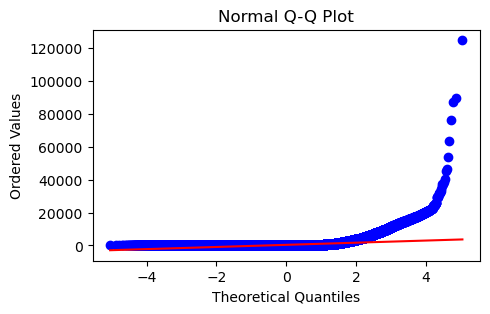

In [18]:
qqplot(train_df.sales)

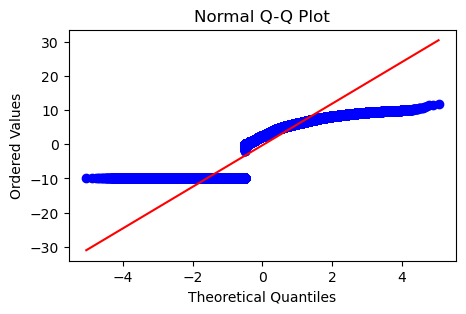

In [19]:
qqplot(np.log(train_df.sales+np.exp(-10))) # a lot of zeros

## plots

### train target

#### missing vals

In [20]:
# missing values
train_df[train_df.isna().any(axis=1)]

,date,store_nbr,family,sales,onpromotion
id,,,,,


#### outliers (wrong vals)

Column 'sales' has 3 outliers.


,sales
id,
2564302,6.00
2578558,6.00
2583904,8.00


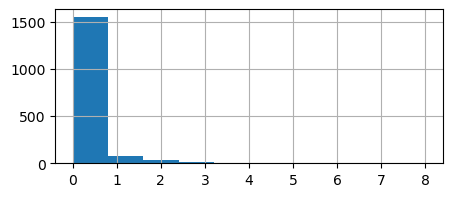

Column 'sales' has 1 outliers.


,sales
id,
1181472,1306.00


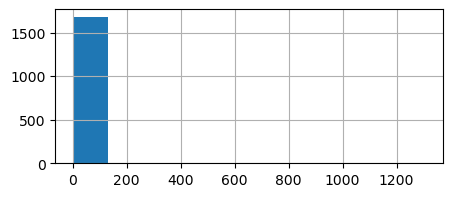

Column 'sales' has 1 outliers.


,sales
id,
1917443,5608.72


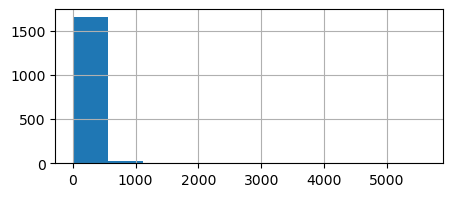

Column 'sales' has 1 outliers.


,sales
id,
2343345,711.00


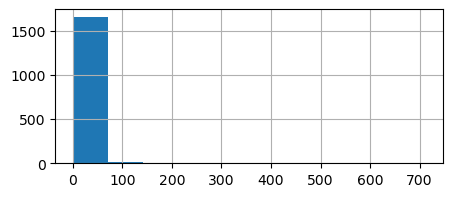

Column 'sales' has 2 outliers.


,sales
id,
1787362,216.00
2138416,269.00


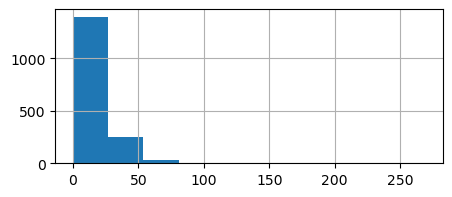

Column 'sales' has 2 outliers.


,sales
id,
2674802,105.00
2831618,93.00


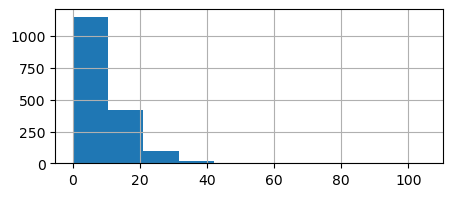

Column 'sales' has 2 outliers.


,sales
id,
2140207,705.00
2610655,798.00


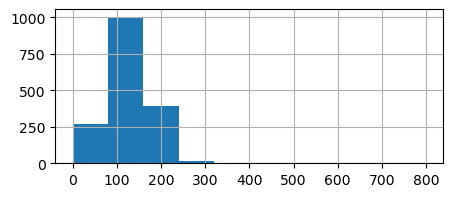

In [21]:
# outliers
for store_nbr in train_df.store_nbr.unique():
    for family in train_df.family.unique():
        tmp = train_df[(train_df.store_nbr==store_nbr) & (train_df.family==family)]
        outliers_zscore(tmp, ['sales'], ycols= [], zscore_cutoff=10)
        
    break

#### general plots

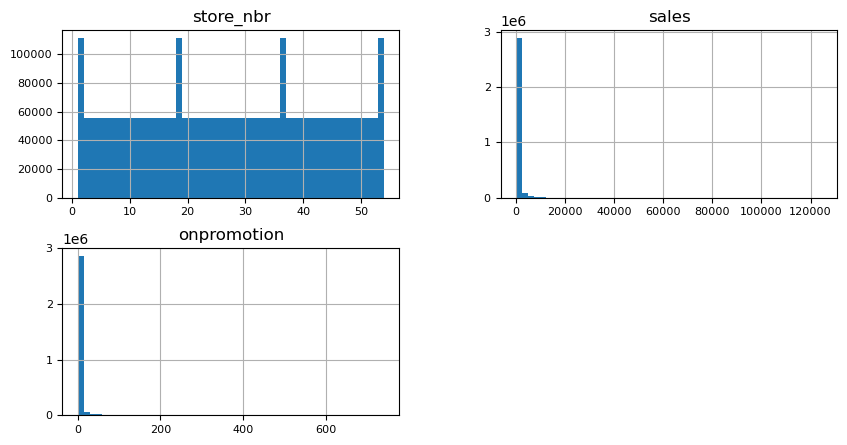

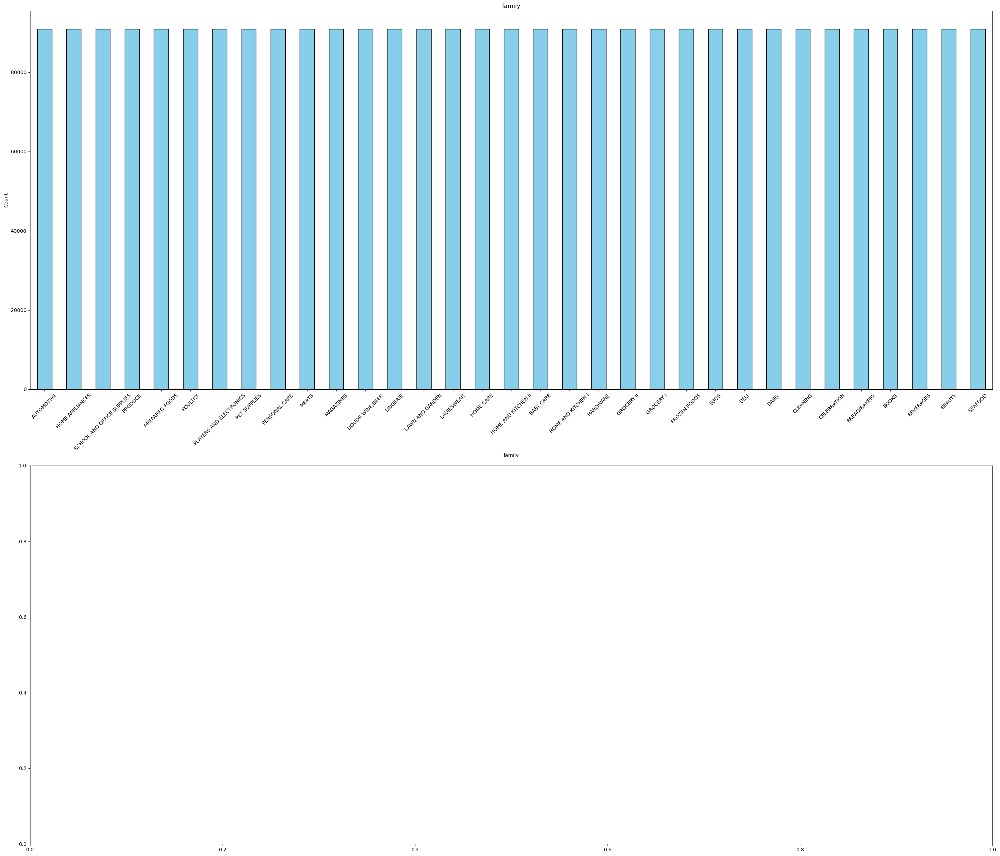

In [22]:
cat_columns, num_columns =  seperate_cat_num(train_df)
plot_numeric_columns(train_df, num_columns)
plot_categorical_columns(train_df, cat_columns)

In [23]:
train_df_family = train_df.groupby(['date','family'])[['sales']].mean().reset_index()
px.line(train_df_family, x='date', y='sales', color='family',width=800, height=400)

In [24]:
sales_by_family = train_df_family.groupby(['family'])['sales'].mean().sort_values().reset_index()
px.bar(sales_by_family, x='sales', y = 'family')

In [25]:
train_df_storenbr = train_df.groupby(['date','store_nbr'])[['sales']].mean().reset_index()
px.line(train_df_storenbr, x='date', y='sales', color='store_nbr')

In [26]:
sales_by_store = train_df_storenbr.groupby(['store_nbr'])['sales'].mean().sort_values().reset_index()
sales_by_store['store_nbr'] = sales_by_store.store_nbr.astype('string')
px.bar(sales_by_store, x='sales', y = 'store_nbr')

#### zeros

In [27]:
# all zeros
agg_sales = train_df.groupby(['store_nbr','family'])['sales'].sum().reset_index()

In [28]:
zero_preds = agg_sales[agg_sales.sales==0]
zero_preds

,store_nbr,family,sales
1,1,BABY CARE,0.00
268,9,BOOKS,0.00
301,10,BOOKS,0.00
334,11,BOOKS,0.00
367,12,BOOKS,0.00
397,13,BABY CARE,0.00
400,13,BOOKS,0.00
433,14,BOOKS,0.00
449,14,LAWN AND GARDEN,0.00
466,15,BOOKS,0.00


In [29]:
zero_pred_df = pd.merge(test_df.reset_index(), zero_preds, how='left',on=['store_nbr','family']).set_index('id')

# predict zeros
test_df_nonzero = zero_pred_df[zero_pred_df.sales.isna()].drop(columns='sales')

# extract the rest
test_pred_zeros = zero_pred_df.dropna()
zero_train = pd.merge(train_df.reset_index(),zero_preds.rename(columns={'sales':'all'}), how='left').set_index('id')
train_df_nonzero = zero_train[zero_train['all'].isna()].drop(columns='all')

In [30]:
test_df.shape[0], test_df_nonzero.shape[0]+test_pred_zeros.shape[0]

(28512, 28512)

In [31]:
store_nbrs = train_df_nonzero.store_nbr.unique()
families= train_df_nonzero.family.unique()

In [32]:
# plot each store 

# for store_nbr in store_nbrs:
#     tmp=train_df_storenbr[train_df_storenbr.store_nbr==store_nbr].iloc[:200]
#     plt.plot(tmp.date, tmp.sales)
#     plt.title(f"{store_nbr}")
#     plt.show()

In [33]:
starts = []
stores_lateropened= [20,21,22,29,36,42,52,53]
for store_nbr in stores_lateropened:
    tmp = train_df_storenbr[train_df_storenbr.store_nbr==store_nbr]
    start=0
    for idx, r in tmp.iterrows():
        if r.sales==0:
            start=r.date
        else:
            break
    starts.append(start)
starts

[Timestamp('2015-02-12 00:00:00'),
 Timestamp('2015-07-23 00:00:00'),
 Timestamp('2015-10-08 00:00:00'),
 Timestamp('2015-03-19 00:00:00'),
 Timestamp('2013-05-08 00:00:00'),
 Timestamp('2015-08-20 00:00:00'),
 Timestamp('2017-04-19 00:00:00'),
 Timestamp('2014-05-28 00:00:00')]

In [34]:
# drop records before store opens
train_df_nonzero['keep'] = False
for start, store_nbr in zip( starts,stores_lateropened):
    keep_indexes = train_df_nonzero[((train_df_nonzero.store_nbr==store_nbr) &
                                        (train_df_nonzero.date>start)) | (train_df_nonzero.keep)].index
    train_df_nonzero.loc[keep_indexes, 'keep']=True
for store_nbr in list(set(store_nbrs)-set(stores_lateropened)):
    keep_indexes = train_df_nonzero[(train_df_nonzero.store_nbr==store_nbr)].index
    train_df_nonzero.loc[keep_indexes, 'keep']=True
train_df_nonzero = train_df_nonzero[train_df_nonzero.keep]

In [35]:
# px.line(train_df_nonzero, x='date',y='sales', color='store_nbr')

#### seasonality

In [36]:
train_df_time = create_date_features(train_df_nonzero, date_col='date')

In [37]:
# seasonality in year
plot_seasonality_px(train_df_time, 'sales', datapoint='month', same_color='year',title='', markers=True)

In [38]:
# seasonality in week
plot_seasonality_px(train_df_time, 'sales', datapoint='dayofweek', same_color='year',title='', markers=True)

In [39]:
# too big to plot
# plot_seasonality_box(train_df_time, 'sales', category='year', same_color='month', title="", points=False)

#### autocorr

In [40]:
def plot_acf_pacf(series,lags=365, title='' ):
    try:
        fig, ax = plt.subplots(1,2,figsize=(15,5))
        sm.graphics.tsa.plot_acf(series, lags=lags, ax=ax[0], title = "acf "+title)
        sm.graphics.tsa.plot_pacf(series, lags=lags, ax=ax[1], title =  "pacf "+title)
        plt.show()
    except:
        pass

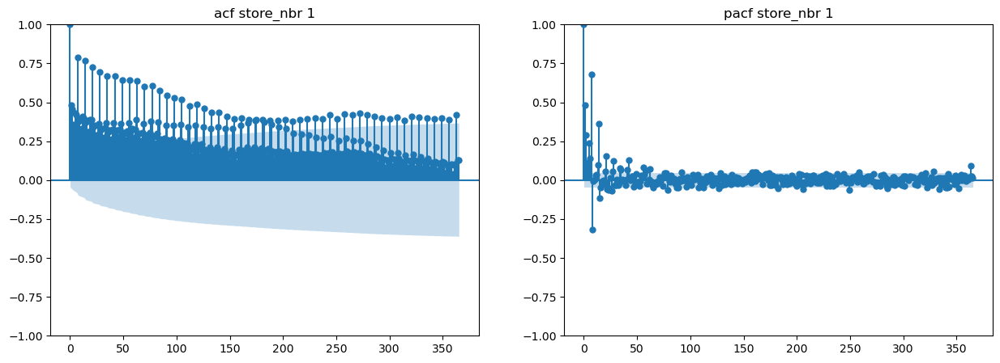

In [41]:
# by store_nbr
train_df_time_by_store = train_df_time.groupby(['date','store_nbr'])['sales'].mean().reset_index()
for store_nbr in store_nbrs:
    plot_acf_pacf(train_df_time_by_store[train_df_time_by_store.store_nbr==store_nbr].set_index('date').sales, 
                  lags=365,
                  title=f'store_nbr {store_nbr}')
    break # shrink notebook size

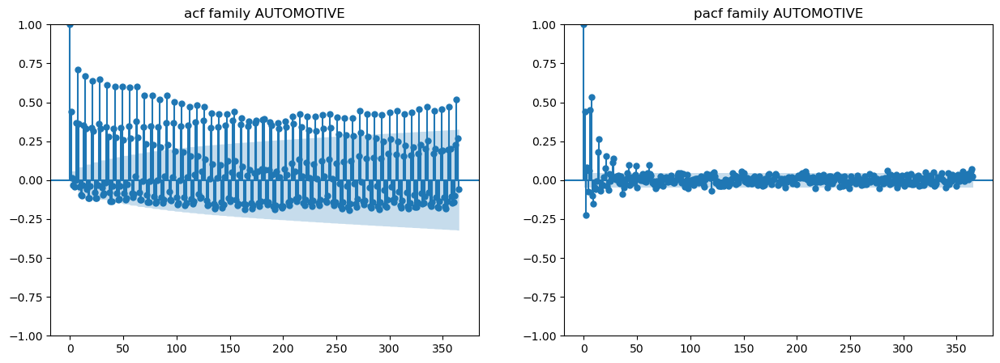

In [42]:
# by family
train_df_time_by_family = train_df_time.groupby(['date','family'])['sales'].mean().reset_index()
for family in families:
    plot_acf_pacf(train_df_time_by_family[train_df_time_by_family.family==family].set_index('date').sales, 
                  lags=365,
                  title=f'family {family}')
    break # shrink notebook size

In [43]:
test_df_nonzero.date.max() - test_df_nonzero.date.min()

Timedelta('15 days 00:00:00')

In [44]:
test_df_nonzero

,date,store_nbr,family,onpromotion
id,,,,
3000888,2017-08-16,1,AUTOMOTIVE,0
3000890,2017-08-16,1,BEAUTY,2
3000891,2017-08-16,1,BEVERAGES,20
3000892,2017-08-16,1,BOOKS,0
3000893,2017-08-16,1,BREAD/BAKERY,12
...,...,...,...,...
3029395,2017-08-31,9,POULTRY,1
3029396,2017-08-31,9,PREPARED FOODS,0
3029397,2017-08-31,9,PRODUCE,1


In [45]:
# identified lags should be larger then test set
identified_lags = [16,20,25,30,35,40,45,50, 60,120, 180,270, 365, 730]

In [46]:
train_test_df = pd.concat([train_df_time[['date','store_nbr','family','sales','onpromotion']], test_df], axis=0)
for lag in identified_lags:
    train_test_df[f'lag_{lag}'] = train_test_df.groupby(['store_nbr','family'])['sales'].shift(lag).fillna(0)

In [47]:
test_df_nonzero

,date,store_nbr,family,onpromotion
id,,,,
3000888,2017-08-16,1,AUTOMOTIVE,0
3000890,2017-08-16,1,BEAUTY,2
3000891,2017-08-16,1,BEVERAGES,20
3000892,2017-08-16,1,BOOKS,0
3000893,2017-08-16,1,BREAD/BAKERY,12
...,...,...,...,...
3029395,2017-08-31,9,POULTRY,1
3029396,2017-08-31,9,PREPARED FOODS,0
3029397,2017-08-31,9,PRODUCE,1


In [48]:
train_df_lag = train_test_df.loc[train_df_nonzero.index]
test_df_lag = train_test_df.loc[test_df_nonzero.index]

In [49]:
lag_colnames= [f'lag_{lag}' for lag in identified_lags]

train_df_lag.groupby(['store_nbr','family'])[['sales']+lag_colnames].corr()['sales'].loc[1,'AUTOMOTIVE']

sales     1.00
lag_16    0.07
lag_20    0.10
lag_25    0.11
lag_30    0.07
lag_35    0.18
lag_40    0.05
lag_45    0.12
lag_50    0.13
lag_60    0.10
lag_120   0.10
lag_180   0.08
lag_270   0.09
lag_365   0.09
lag_730   0.17
Name: sales, dtype: float64

### transactions

In [50]:
train_per_store = train_df_nonzero.groupby(['date','store_nbr'])['sales'].sum().reset_index()
sales_transactions = pd.merge(train_per_store, transactions, how='inner', on =['date', 'store_nbr'])
sales_transactions[['sales','transactions']].corr()

,sales,transactions
sales,1.00,0.84
transactions,0.84,1.00


In [51]:
sales_transactions

,date,store_nbr,sales,transactions
0,2013-01-01,25,2511.62,770
1,2013-01-02,1,7417.15,2111
2,2013-01-02,2,10266.72,2358
3,2013-01-02,3,24060.35,3487
4,2013-01-02,4,10200.08,1922
...,...,...,...,...
83483,2017-08-15,50,16879.12,2804
83484,2017-08-15,51,20154.56,1573
83485,2017-08-15,52,18600.05,2255
83486,2017-08-15,53,8208.19,932


In [52]:
# plot correlations
px.scatter(sales_transactions, x='sales',y='transactions', trendline='ols', trendline_color_override='red')

In [53]:
transaction_timefeatures =  create_date_features(transactions)

In [54]:
plot_seasonality_box(transaction_timefeatures, target='transactions', category='year', same_color='month', points=False)

In [55]:
plot_seasonality_px(transaction_timefeatures, 'transactions',datapoint='month', same_color='year')

In [56]:
plot_seasonality_px(transaction_timefeatures, 'transactions',datapoint='dayofweek', same_color='year')

transaction: 

1. high corr with sales
2. strong seasonality

In [57]:
X_transaction_train = transaction_timefeatures[transaction_timefeatures.date<'2017-08-01'].drop(columns=['transactions','date'])
X_transaction_test = transaction_timefeatures[transaction_timefeatures.date>='2017-08-01'].drop(columns=['transactions','date'])
y_transaction_train = transaction_timefeatures[transaction_timefeatures.date<'2017-08-01'][['transactions']]
y_transaction_test = transaction_timefeatures[transaction_timefeatures.date>='2017-08-01'][['transactions']]

In [58]:
from utils_models_reg import *

In [59]:
X_transaction_test_real = test_df.groupby(['date', 'store_nbr']).count().reset_index()[['date', 'store_nbr']]
X_transaction_test_real_timefeatures =  create_date_features(X_transaction_test_real).drop(columns=['date'])


training performance

R² Score: 0.92
RMSE: 267.29
MAE: 191.12

test performance

R² Score: 0.93
RMSE: 246.46
MAE: 183.44


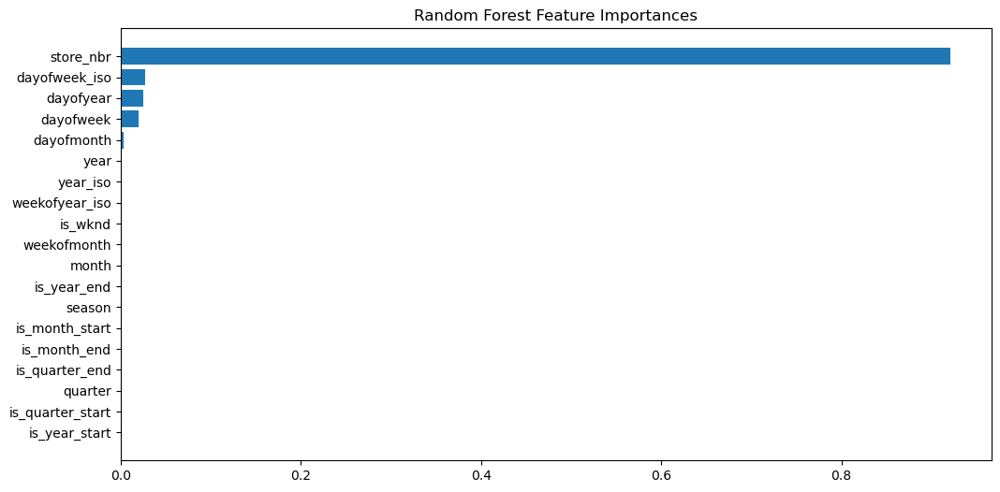

In [60]:
y_fit_train, y_pred_test, y_pred_test_real = rf(X_transaction_train, X_transaction_test, 
                                                y_transaction_train, y_transaction_test, 
                                                X_transaction_test_real_timefeatures)

In [61]:
y_pred_test_real['date'] = X_transaction_test_real.date
y_pred_test_real['store_nbr'] =X_transaction_test_real.store_nbr

In [62]:
y_pred_test_real = y_pred_test_real.rename(columns={0:'transactions'})

In [63]:
test_df_lag_transactions = pd.merge(test_df_lag.reset_index(), y_pred_test_real, how='left',on=['date','store_nbr']).set_index('id')
test_df_lag_transactions_time = create_date_features(test_df_lag_transactions, date_col='date').drop(columns='sales')

In [64]:
train_df_lag_transactions = pd.merge(train_df_lag.reset_index(), 
                                     transaction_timefeatures[['date','transactions','store_nbr']], 
                                     how='left',on=['date','store_nbr']).set_index('id')
train_df_lag_transactions_time = create_date_features(train_df_lag_transactions, date_col='date')
train_df_lag_transactions_time['transactions'] = train_df_lag_transactions_time.transactions.fillna(method='bfill')

In [65]:
train_df_lag_transactions_time.shape, train_df_lag.shape

((2698648, 38), (2698648, 19))

##### arima for each store_nbr

In [66]:
store1 = transactions[transactions.store_nbr==1][['date','transactions']].set_index('date')

In [67]:
store1_train, store1_test = store1[store1.index<'2017-08-01'],store1[store1.index>='2017-08-01']

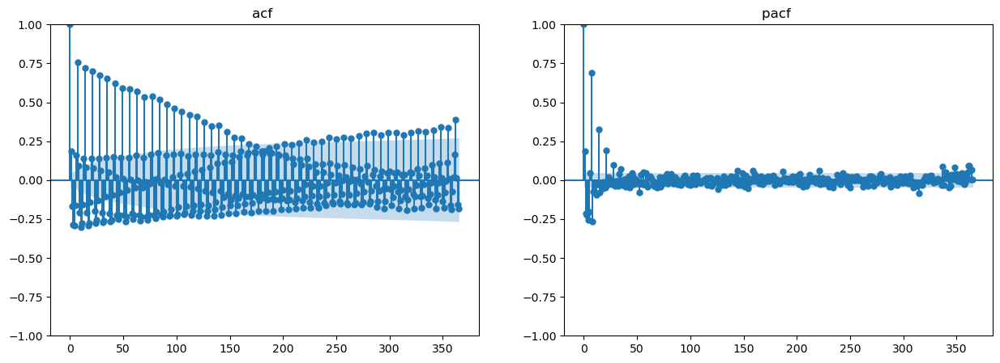

In [68]:
plot_acf_pacf(store1, 365)

In [69]:
from pmdarima import auto_arima
## lungbox: high p means fail to reject H0 => residuals uncorrelated => model is good
def arima(series, seasonality=7, pred_periods = 7):
    model = auto_arima(
        series,
        # with_intercept=True,
        # trend='linear', # need  with_intercept=True
        seasonal=True,
        m=seasonality,  # weekly seasonality: seasonality=7
        stepwise=True,
        trace=True,
        suppress_warnings=True,
        error_action="ignore",
        information_criterion = 'aic'
    )
    display(model.summary())
    display(model.order)
    pred = pd.DataFrame(model.predict(n_periods=pred_periods))
    return pred, model

In [74]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):
    # Run the ADF test
    result = adfuller(series)

    # Print results
    print("ADF Statistic:", result[0])
    print("p-value:", result[1])
    print("Number of lags used:", result[2])
    print("Number of observations:", result[3])
    print("Critical Values:")
    for key, value in result[4].items():
        print(f"   {key}: {value}")

In [76]:
adf_test(store1_train)

ADF Statistic: -7.618881026509502
p-value: 2.1548806322434416e-11
Number of lags used: 21
Number of observations: 1639
Critical Values:
   1%: -3.434346077596202
   5%: -2.8633050385525523
   10%: -2.567709666778468


In [70]:
pred, model = arima(store1_train, len(store1_test))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[15] intercept   : AIC=25186.648, Time=2.32 sec
 ARIMA(0,0,0)(0,0,0)[15] intercept   : AIC=25384.006, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[15] intercept   : AIC=25328.304, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[15] intercept   : AIC=25290.916, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[15]             : AIC=29236.281, Time=0.01 sec
 ARIMA(2,0,2)(0,0,1)[15] intercept   : AIC=25226.505, Time=1.95 sec
 ARIMA(2,0,2)(1,0,0)[15] intercept   : AIC=25253.606, Time=1.91 sec
 ARIMA(2,0,2)(2,0,1)[15] intercept   : AIC=24990.556, Time=4.69 sec
 ARIMA(2,0,2)(2,0,0)[15] intercept   : AIC=25237.317, Time=4.39 sec
 ARIMA(2,0,2)(2,0,2)[15] intercept   : AIC=24939.493, Time=7.51 sec
 ARIMA(2,0,2)(1,0,2)[15] intercept   : AIC=25018.225, Time=7.93 sec
 ARIMA(1,0,2)(2,0,2)[15] intercept   : AIC=inf, Time=7.35 sec
 ARIMA(2,0,1)(2,0,2)[15] intercept   : AIC=24966.772, Time=4.56 sec
 ARIMA(3,0,2)(2,0,2)[15] intercept   : AIC=25062.113, Time=8.93 sec
 ARIMA(2,0,

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                 1661
Model:             SARIMAX(2, 0, 2)x(2, 0, 2, 15)   Log Likelihood              -12459.747
Date:                            Mon, 09 Jun 2025   AIC                          24939.493
Time:                                    19:55:56   BIC                          24993.645
Sample:                                         0   HQIC                         24959.564
                                           - 1661                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   2852.7799    216.126     13.200      0.000    2429.181    3276.379
ar.L1         -1.6033      0.066    -24.453      0.000      -1.732      -1.475
ar.L2         -0.7035      0.049    -14.384      0.000      -0.799      -0.608
ma.L1          1.7364      0.071     24.558      0.000       1.598       1.875
ma.L2          0.7695      0.065     11.809      0.000       0.642       0.897
ar.S.L15       1.1633      0.052     22.510      0.000       1.062       1.265
ar.S.L30      -0.7307      0.042    -17.522      0.000      -0.812      -0.649
ma.S.L15      -1.1950      0.065    -18.382      0.000      -1.322      -1.068
ma.S.L30       0.5535      0.058      9.497      0.000       0.439       0.668
sigma2       2.03e+05   8493.014     23.906      0.000    1.86e+05     2.2e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.85   Jarque-Bera (JB):                76.08
Prob(Q):                              0.36   Prob(JB):                         0.00
Heteroskedasticity (H):               1.07   Skew:                            -0.52
Prob(H) (two-sided):                  0.41   Kurtosis:                         3.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

(2, 0, 2)

In [71]:
pred_test = pd.DataFrame(pred.iloc[:, 0], columns=store1_test.columns, index=store1_test.index )
# pred_test.columns=store1_test.columns
# pred_test.index=store1_test.index

In [72]:
performance(store1_test, pred_test)

ValueError: Input contains NaN.

In [5]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(store1_train)


NameError: name 'store1_train' is not defined

In [1]:
store1_train

NameError: name 'store1_train' is not defined

### holidays

In [60]:
holidays = pd.read_csv('holidays_events.csv', parse_dates=['date'])
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [61]:
stores = pd.read_csv('stores.csv')
stores.head(10)

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [62]:
storenum2city = dict(stores[['store_nbr', 'city']].values)
storenum2state = dict(stores[['store_nbr', 'state']].values)

In [63]:
from collections import defaultdict

def reverse_dict(d):
    ans = defaultdict(list)
    for key, value in d.items():
        ans[value].append(key)
    return ans

In [64]:
city2storenum = reverse_dict(storenum2city)
state2storenum = reverse_dict(storenum2state)
country2storenum = {'National':list(store_nbrs)}
holidays['store_city'] = holidays['locale_name'].map(city2storenum).fillna("").apply(list)
holidays['store_state'] = holidays['locale_name'].map(state2storenum).fillna("").apply(list)
holidays['store_national'] = holidays['locale'].map(country2storenum).fillna("").apply(list)

holidays['stores'] = holidays.store_city + holidays.store_state + holidays.store_national
holidays = holidays.drop(columns=['store_city','store_state','store_national'])

In [65]:
holidays.loc[(holidays.type=='Holiday') & (holidays.transferred),'type']='Work Day'

In [66]:
holiday_cnt = holidays.groupby(['date'])['type'].count()

In [67]:
holidays

,date,type,locale,locale_name,description,transferred,stores
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False,"[52, 53]"
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False,"[12, 13]"
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False,"[37, 39, 42]"
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False,[36]
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False,[14]
...,...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False,"[1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,..."
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False,"[1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,..."
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False,"[1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,..."
348,2017-12-25,Holiday,National,Ecuador,Navidad,False,"[1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,..."


In [68]:
def and_agg(series):
    return series.all()
holidays = holidays.groupby(['date'])[['type','transferred','stores']].agg({
                                                    'type':set, 
                                                    'transferred': and_agg,
                                                    'stores':sum})

In [69]:
holidays

,type,transferred,stores
date,,,
2012-03-02,{Holiday},False,"[52, 53]"
2012-04-01,{Holiday},False,"[12, 13]"
2012-04-12,{Holiday},False,"[37, 39, 42]"
2012-04-14,{Holiday},False,[36]
2012-04-21,{Holiday},False,[14]
...,...,...,...
2017-12-22,"{Holiday, Additional}",False,"[25, 1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19..."
2017-12-23,{Additional},False,"[1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,..."
2017-12-24,{Additional},False,"[1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2,..."


In [70]:
holidays['isHoliday'] =  holidays.type.apply(lambda x: 'Holiday' in x)
holidays['isWorkDay'] =  holidays.type.apply(lambda x: 'Work Day' in x)
holidays['isTransfer'] =  holidays.type.apply(lambda x: 'Transfer' in x)
holidays['isAdditional'] =  holidays.type.apply(lambda x: 'Additional' in x)
holidays['isBridge'] =  holidays.type.apply(lambda x: 'Bridge' in x)
holidays['isEvent'] =  holidays.type.apply(lambda x: 'Event' in x)
holidays = holidays.drop(columns='type')


In [71]:
holidays_explode = holidays.explode('stores')
holidays_explode = holidays_explode.rename(columns={'stores':'store_nbr'})
holidays_explode

,transferred,store_nbr,isHoliday,isWorkDay,isTransfer,isAdditional,isBridge,isEvent
date,,,,,,,,
2012-03-02,False,52,True,False,False,False,False,False
2012-03-02,False,53,True,False,False,False,False,False
2012-04-01,False,12,True,False,False,False,False,False
2012-04-01,False,13,True,False,False,False,False,False
2012-04-12,False,37,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...
2017-12-26,False,54,False,False,False,True,False,False
2017-12-26,False,6,False,False,False,True,False,False
2017-12-26,False,7,False,False,False,True,False,False


In [72]:
train_df_by_store = train_df_lag_transactions_time.groupby(['date','store_nbr']).sales.mean().reset_index()

In [73]:
train_df_by_store_holidays = pd.merge(train_df_by_store, holidays_explode, how='left',on=['date', 'store_nbr'])

In [74]:
for col in ['transferred', 'isHoliday','isTransfer','isAdditional','isBridge','isEvent' ]:
    train_df_by_store_holidays[col]=train_df_by_store_holidays[col].fillna(False)
for col in ['isWorkDay']:
    train_df_by_store_holidays[col]=train_df_by_store_holidays[col].fillna(True)

In [75]:
train_df_by_store_holidays[['transferred', 'isHoliday','isTransfer',
                            'isAdditional','isBridge','isEvent', 'isWorkDay']]=\
    train_df_by_store_holidays[['transferred', 'isHoliday','isTransfer',
                                'isAdditional','isBridge','isEvent', 'isWorkDay']].astype(int)

In [76]:
train_df_by_store_holidays.columns

Index(['date', 'store_nbr', 'sales', 'transferred', 'isHoliday', 'isWorkDay',
       'isTransfer', 'isAdditional', 'isBridge', 'isEvent'],
      dtype='object')

In [77]:
for col in ['isHoliday', 'isWorkDay',
       'isTransfer', 'isAdditional', 'isBridge', 'isEvent']:
    display(train_df_by_store_holidays.groupby(col).sales.mean().reset_index())

,isHoliday,sales
0,0,396.47
1,1,414.41


,isWorkDay,sales
0,0,465.51
1,1,390.67


,isTransfer,sales
0,0,396.59
1,1,500.04


,isAdditional,sales
0,0,393.52
1,1,571.72


,isBridge,sales
0,0,396.78
1,1,515.15


,isEvent,sales
0,0,394.48
1,1,467.26


In [78]:
holiday_type_order = []

In [79]:
for col in ['isHoliday', 'isWorkDay',
       'isTransfer', 'isAdditional', 'isBridge', 'isEvent']:
    plot=px.box(train_df_by_store_holidays, x=col, y='sales', points=False)
    plot.show()

In [80]:
# corr
train_df_by_store_holidays.groupby('store_nbr')[[ 'store_nbr', 'sales', 'transferred', 'isHoliday', 'isWorkDay',
       'isTransfer', 'isAdditional', 'isBridge', 'isEvent']].corr()['sales'].mean()

0.14681908027528634

In [81]:
# prepare features

train_df_lag_transactions_time_holiday = pd.merge(train_df_lag_transactions_time.reset_index(),
                                                  holidays_explode.reset_index(), 
                                                  how='left',on=['date','store_nbr']).drop_duplicates().set_index('id')

for col in ['transferred', 'isHoliday','isTransfer','isAdditional','isBridge','isEvent' ]:
    train_df_lag_transactions_time_holiday[col]=train_df_lag_transactions_time_holiday[col].fillna(False)
for col in ['isWorkDay']:
    train_df_lag_transactions_time_holiday[col]=train_df_lag_transactions_time_holiday[col].fillna(True)

In [82]:
test_df_lag_transactions_time_holiday = pd.merge(test_df_lag_transactions_time.reset_index(), 
                                                 holidays_explode.reset_index(),
                                                 how='left',on=['date','store_nbr']).drop_duplicates()
for col in ['transferred', 'isHoliday','isTransfer','isAdditional','isBridge','isEvent' ]:
    test_df_lag_transactions_time_holiday[col]=test_df_lag_transactions_time_holiday[col].fillna(False)
for col in ['isWorkDay']:
    test_df_lag_transactions_time_holiday[col]=test_df_lag_transactions_time_holiday[col].fillna(True)

In [83]:
test_df_lag_transactions_time_holiday.shape, test_df_nonzero.shape

((27664, 45), (27664, 4))

In [84]:
train_df_lag_transactions_time_holiday.shape, train_df_nonzero.shape

((2698648, 45), (2698648, 21))

### oil

In [86]:
oil = pd.read_csv("oil.csv", parse_dates=['date'])
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [87]:
px.line(oil, x='date',y='dcoilwtico')


In [88]:
all_dates = list(train_df_lag_transactions_time_holiday.date.unique()) + \
 list(test_df_lag_transactions_time_holiday.date.unique()) 

In [89]:
len(all_dates)

1700

In [90]:
oil = oil.set_index('date').reindex(all_dates).interpolate(method='linear').reset_index()
px.line(oil, x='date',y='dcoilwtico')

In [91]:
oil[oil.dcoilwtico.isna()]

,date,dcoilwtico
0,2013-01-01,NaN


In [92]:
oil = oil.fillna(method='bfill')

In [93]:
oil.set_index('date').index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2017-08-22', '2017-08-23', '2017-08-24', '2017-08-25',
               '2017-08-26', '2017-08-27', '2017-08-28', '2017-08-29',
               '2017-08-30', '2017-08-31'],
              dtype='datetime64[ns]', name='date', length=1700, freq=None)

In [94]:
train_by_date= train_df_lag_transactions_time_holiday.groupby(['date']).sales.sum()
train_by_date

date
2013-01-01     2511.62
2013-01-02   496092.42
2013-01-03   361461.23
2013-01-04   354459.68
2013-01-05   477350.12
                ...   
2017-08-11   826373.72
2017-08-12   792630.54
2017-08-13   865639.68
2017-08-14   760922.41
2017-08-15   762661.94
Name: sales, Length: 1684, dtype: float64

In [95]:
oil_sales_corr = pd.concat([oil.set_index('date'), train_by_date], axis=1).loc[train_by_date.index].corr()
oil_sales_corr

,dcoilwtico,sales
dcoilwtico,1.00,-0.63
sales,-0.63,1.00


strong negative correlation

In [96]:
train_df_lag_transactions_time_holiday_oil = pd.merge(train_df_lag_transactions_time_holiday.reset_index(), 
                                                      oil, how='left',on='date').set_index('id')
test_df_lag_transactions_time_holiday_oil = pd.merge(test_df_lag_transactions_time_holiday, 
                                                     oil, how='left',on='date').set_index('id')

In [97]:
train_df_lag_transactions_time_holiday_oil[train_df_lag_transactions_time_holiday_oil.isna().any(axis=1)].head()

,date,store_nbr,family,sales,onpromotion,lag_16,lag_20,lag_25,lag_30,lag_35,lag_40,lag_45,lag_50,lag_60,lag_120,lag_180,lag_270,lag_365,lag_730,transactions,month,dayofmonth,dayofyear,weekofmonth,dayofweek,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,year_iso,weekofyear_iso,dayofweek_iso,transferred,isHoliday,isWorkDay,isTransfer,isAdditional,isBridge,isEvent,dcoilwtico
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [98]:
test_df_lag_transactions_time_holiday_oil[test_df_lag_transactions_time_holiday_oil.isna().any(axis=1)].head()

,date,store_nbr,family,onpromotion,lag_16,lag_20,lag_25,lag_30,lag_35,lag_40,lag_45,lag_50,lag_60,lag_120,lag_180,lag_270,lag_365,lag_730,transactions,month,dayofmonth,dayofyear,weekofmonth,dayofweek,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,year_iso,weekofyear_iso,dayofweek_iso,transferred,isHoliday,isWorkDay,isTransfer,isAdditional,isBridge,isEvent,dcoilwtico
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [99]:
train_df_lag_transactions_time_holiday_oil.shape, train_df_nonzero.shape

((2698648, 46), (2698648, 21))

In [100]:
test_df_lag_transactions_time_holiday_oil.shape, test_df_nonzero.shape

((27664, 45), (27664, 4))

### stores

In [101]:
stores

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [102]:
train_df_lag_transactions_time_holiday_oil_stores = pd.merge(train_df_lag_transactions_time_holiday_oil.reset_index(),
                                                              stores, how='left', on=['store_nbr']).set_index('id')

In [103]:
test_df_lag_transactions_time_holiday_oil_stores = pd.merge(test_df_lag_transactions_time_holiday_oil.reset_index(),
                                                              stores, how='left', on=['store_nbr']).set_index('id')

In [104]:
train_df_lag_transactions_time_holiday_oil_stores.shape, train_df_nonzero.shape

((2698648, 50), (2698648, 21))

In [105]:
test_df_lag_transactions_time_holiday_oil_stores.shape, test_df_nonzero.shape

((27664, 49), (27664, 4))

# Model

In [106]:
train_df_lag_transactions_time_holiday_oil['store_nbr'] = train_df_lag_transactions_time_holiday_oil.store_nbr.astype(int)
test_df_lag_transactions_time_holiday_oil['store_nbr'] = test_df_lag_transactions_time_holiday_oil.store_nbr.astype(int)

In [107]:
Train = train_df_lag_transactions_time_holiday_oil[train_df_lag_transactions_time_holiday_oil.date<'2017-08-01']
Test = train_df_lag_transactions_time_holiday_oil[train_df_lag_transactions_time_holiday_oil.date>='2017-08-01']

In [108]:
X_train = Train.drop(columns=['sales','date'])
y_train = Train[['sales']]
X_test = Test.drop(columns=['sales','date'])
y_test=Test[['sales']]

In [109]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((2672713, 44), (2672713, 1), (25935, 44), (25935, 1))

In [110]:
X_test_real = test_df_lag_transactions_time_holiday_oil.drop(columns=['date'])

In [111]:
X_train[X_train.isna().any(axis=1)]

,store_nbr,family,onpromotion,lag_16,lag_20,lag_25,lag_30,lag_35,lag_40,lag_45,lag_50,lag_60,lag_120,lag_180,lag_270,lag_365,lag_730,transactions,month,dayofmonth,dayofyear,weekofmonth,dayofweek,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,year_iso,weekofyear_iso,dayofweek_iso,transferred,isHoliday,isWorkDay,isTransfer,isAdditional,isBridge,isEvent,dcoilwtico
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


## Preprocess

In [112]:
X_train,  X_test, X_test_real= OHE(X_train, X_test, X_test_real, cat_columns = ['family'])

In [113]:
X_train.dtypes

store_nbr                              int64
onpromotion                            int64
lag_16                               float64
lag_20                               float64
lag_25                               float64
                                      ...   
family_POULTRY                       float64
family_PREPARED FOODS                float64
family_PRODUCE                       float64
family_SCHOOL AND OFFICE SUPPLIES    float64
family_SEAFOOD                       float64
Length: 75, dtype: object

## LR


training performance

R² Score: 0.87
RMSE: 422.31
MAE: 131.21

test performance

R² Score: 0.95
RMSE: 287.61
MAE: 121.27


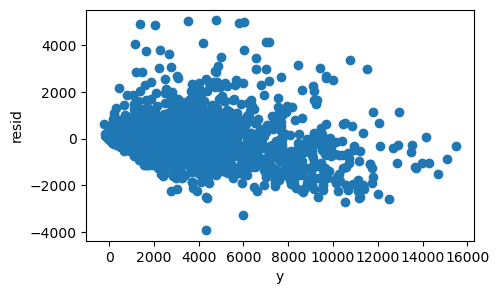

In [114]:
y_fit_train, y_pred_test, y_pred_test_real = lr(X_train, X_test, y_train, y_test, X_test_real)

In [115]:
(r2_train,rmse_train,mae_train),(r2_test,rmse_test,mae_test) = performance_both(y_train, y_fit_train, y_test, y_pred_test)


training performance

R² Score: 0.87
RMSE: 422.31
MAE: 131.21

test performance

R² Score: 0.95
RMSE: 287.61
MAE: 121.27


## DTree


training performance

R² Score: 0.86
RMSE: 428.32
MAE: 131.20

test performance

R² Score: 0.92
RMSE: 356.61
MAE: 133.55


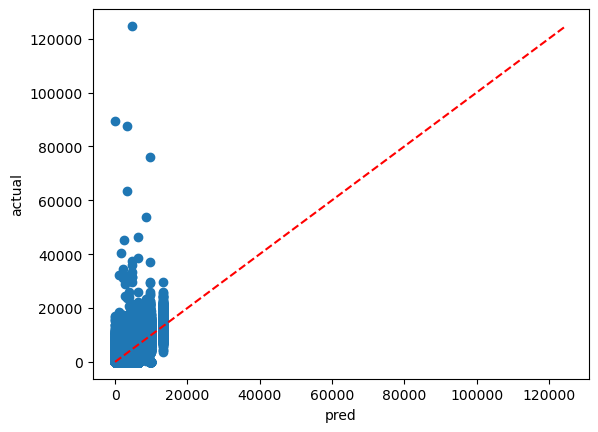

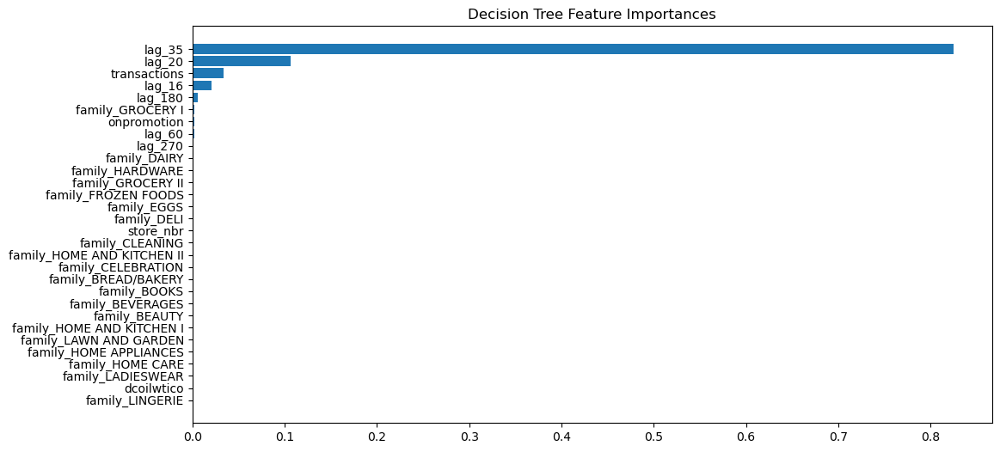

In [116]:
y_fit_train, y_pred_test, y_pred_test_real = dtree(X_train, X_test, y_train, y_test ,X_test_real)

In [117]:
(r2_train,rmse_train,mae_train),(r2_test,rmse_test,mae_test) =\
      performance_both(y_train, y_fit_train, y_test, y_pred_test)


training performance

R² Score: 0.86
RMSE: 428.32
MAE: 131.20

test performance

R² Score: 0.92
RMSE: 356.61
MAE: 133.55


## Rf

In [118]:
# y_fit_rf, y_pred_rf, y_pred_test_real = rf(X_train, X_test, y_train, y_test, X_test_real)

In [119]:
# (r2_train,rmse_train,mae_train),(r2_test,rmse_test,mae_test) = performance_both(y_train, y_fit_rf, y_test, y_pred_rf)

## XGB


training performance

R² Score: 0.95
RMSE: 246.43
MAE: 67.45

test performance

R² Score: 0.96
RMSE: 257.80
MAE: 83.92


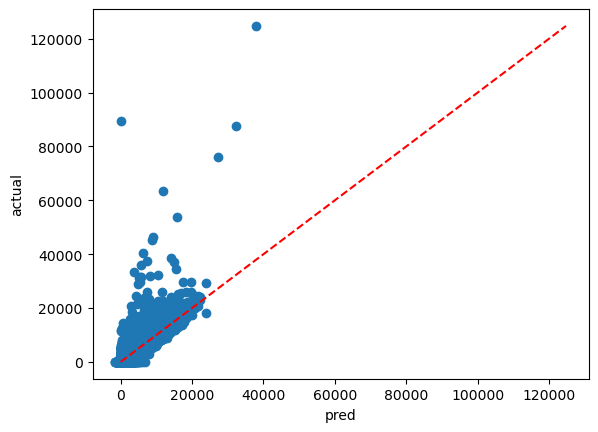

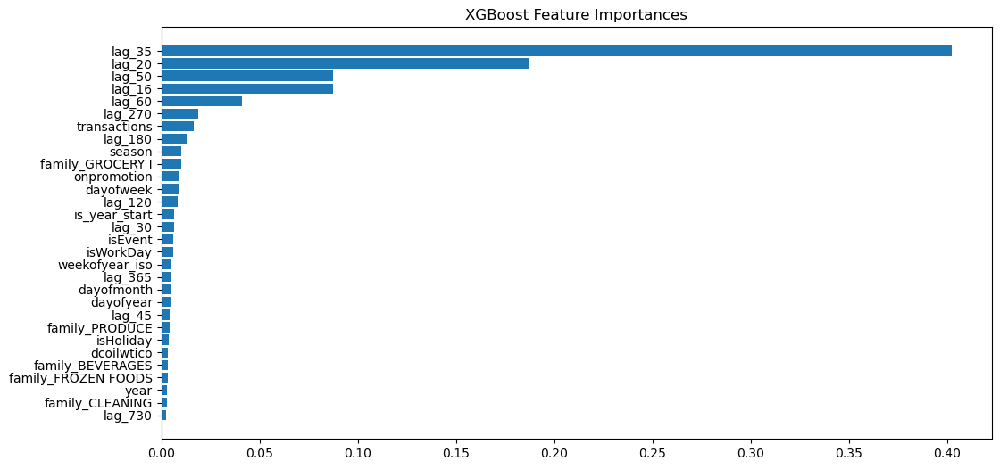

In [120]:
y_fit_xgb, y_pred_xgb, y_pred_test_real = xgb_predictor(X_train, X_test, y_train, y_test, X_test_real)

In [121]:
(r2_train,rmse_train,mae_train),(r2_test,rmse_test,mae_test) = performance_both(y_train, y_fit_xgb, y_test, y_pred_xgb)


training performance

R² Score: 0.95
RMSE: 246.43
MAE: 67.45

test performance

R² Score: 0.96
RMSE: 257.80
MAE: 83.92


In [122]:
X_all = pd.concat([X_train, X_test], axis=0)
y_all =  pd.concat([y_train, y_test], axis=0)


training performance

R² Score: 0.95
RMSE: 246.97
MAE: 67.74

test performance

R² Score: 0.95
RMSE: 246.97
MAE: 67.74


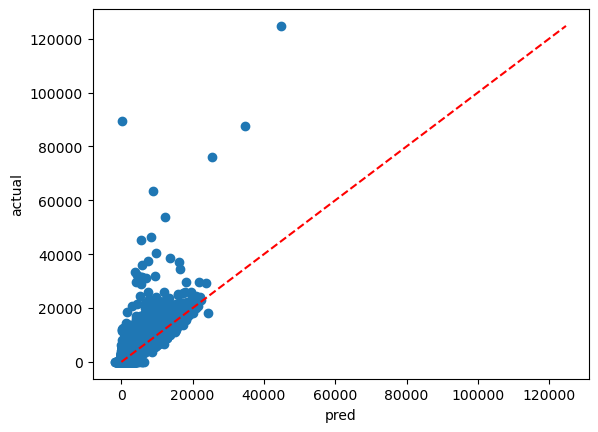

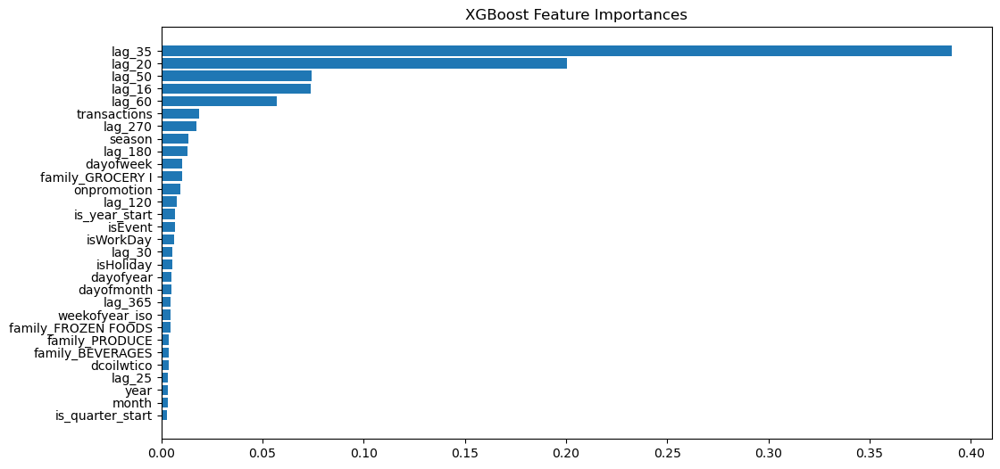

In [123]:
y_fit_xgb, y_pred_xgb, y_pred_test_real = xgb_predictor(X_all, X_all, y_all, y_all, X_test_real)

In [124]:
# xgb_sklearn = XGBRegressor(max_depth= 6, # How deep should each tree be?
#         eta= 0.1, # The learning rate: how big are our steps?
#         verbosity= 0, # Whether to print out messages as you fit. 1 makes it quiet
#         objective='reg:squarederror', # What is our loss function? For now, logistic - outputs probability. Would change for multiclass
#         gamma= 1, # Minimum loss reduction
#         subsample= 1, # How much to subsample for each tree. Smaller number (like 0.5) would subsample
#         colsample_bytree=1, # like the random forest restriction on variables, sample of columns to get
#         lam=0, # How much L2 penalty on the node weights
#         alpha=0, # How much L1 penalty on the node weights
#         eval_metric='mae', # this is the default eval_metric for logistic 
#         min_child_weight = 1,# Minimum sum of instance weights (hessian) in a child. 
#         seed= 1)
# # y_pred_xgb_sklearn_train, y_pred_xgb_sklearn,y_pred_test_real = gridSearch(xgb_sklearn, X_train, X_test, y_train, y_test, X_test_real)

In [125]:
y_pred_test_real.columns=['sales']

## ordinal encoding

In [126]:
# small_to_large_families = train_df_lag_transactions_time_holiday_oil.groupby(['family']).sales.mean().sort_values().index.tolist()
# ordinal_map={'family': small_to_large_families}

In [127]:
train_df_lag_transactions_time_holiday_oil_stores['store_nbr']=train_df_lag_transactions_time_holiday_oil_stores.store_nbr.astype(int)
test_df_lag_transactions_time_holiday_oil_stores['store_nbr'] = test_df_lag_transactions_time_holiday_oil_stores.store_nbr.astype(int)

In [128]:
ordinal_map={col: train_df_lag_transactions_time_holiday_oil_stores.groupby([col]).sales.mean().sort_values().index.tolist()
            for col in ['family','city','state','type']}

In [129]:
Train = train_df_lag_transactions_time_holiday_oil_stores[train_df_lag_transactions_time_holiday_oil_stores.date<'2017-08-01']
Test = train_df_lag_transactions_time_holiday_oil_stores[train_df_lag_transactions_time_holiday_oil_stores.date>='2017-08-01']
Train, Test, ord_encoder = encode_ordinal_features(Train, Test, ordinal_map,  ['family','city','state','type'] )

In [130]:
X_test_real = test_df_lag_transactions_time_holiday_oil_stores.drop(columns=['date'])
X_test_real[ ['family','city','state','type']]=ord_encoder.transform(X_test_real[ ['family','city','state','type']])

In [131]:
X_train = Train.drop(columns=['sales','date'])
y_train = Train[['sales']]
X_test = Test.drop(columns=['sales','date'])
y_test=Test[['sales']]


training performance

R² Score: 0.95
RMSE: 248.42
MAE: 66.83

test performance

R² Score: 0.96
RMSE: 249.74
MAE: 81.48


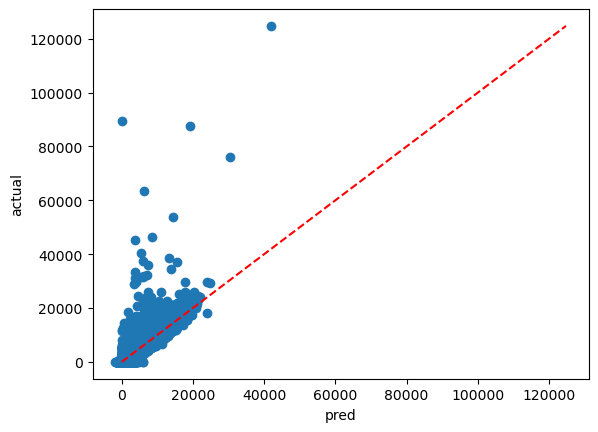

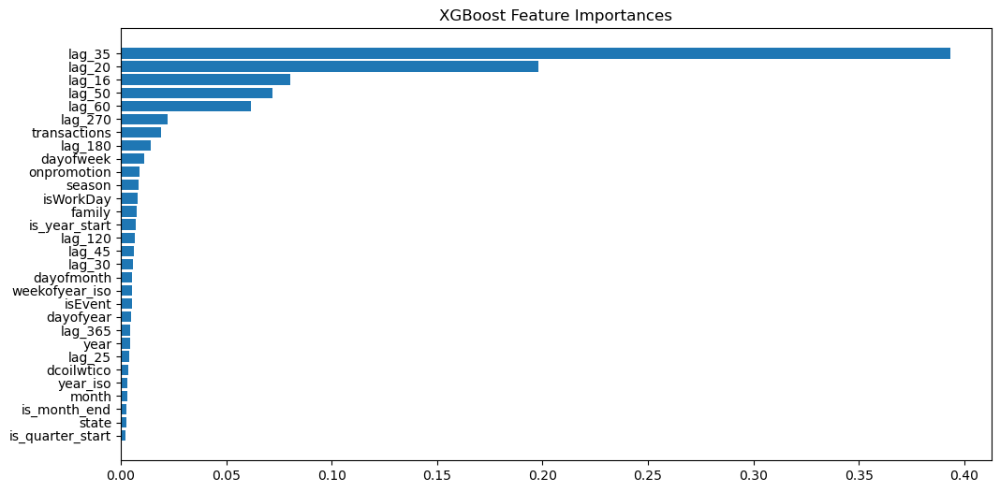

In [132]:
y_fit_xgb, y_pred_xgb, y_pred_test_real = xgb_predictor(X_train, X_test, y_train, y_test, X_test_real)

In [133]:
X_all = pd.concat([X_train, X_test], axis=0)
y_all =  pd.concat([y_train, y_test], axis=0)

In [134]:
X_all.iloc[:1,:]

,store_nbr,family,onpromotion,lag_16,lag_20,lag_25,lag_30,lag_35,lag_40,lag_45,lag_50,lag_60,lag_120,lag_180,lag_270,lag_365,lag_730,transactions,month,dayofmonth,dayofyear,weekofmonth,dayofweek,year,is_wknd,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,season,year_iso,weekofyear_iso,dayofweek_iso,transferred,isHoliday,isWorkDay,isTransfer,isAdditional,isBridge,isEvent,dcoilwtico,city,state,type,cluster
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,8.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,770.00,1,1,1,1,2,2013,0,1,1,0,1,0,1,0,0,2013,1,2,False,True,False,False,False,False,False,93.14,21.00,15.00,2.00,13



training performance

R² Score: 0.95
RMSE: 246.01
MAE: 66.57

test performance

R² Score: nan
RMSE: 21.63
MAE: 21.63


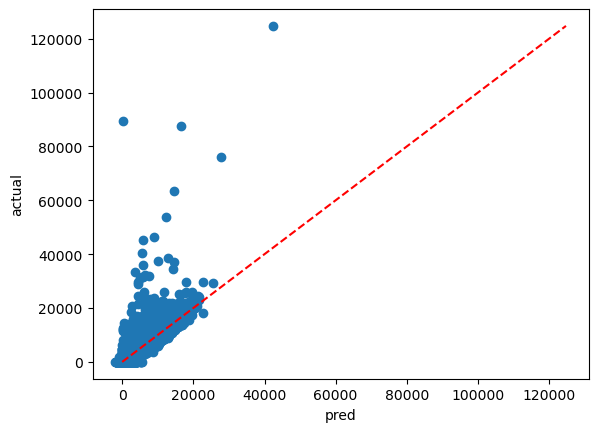

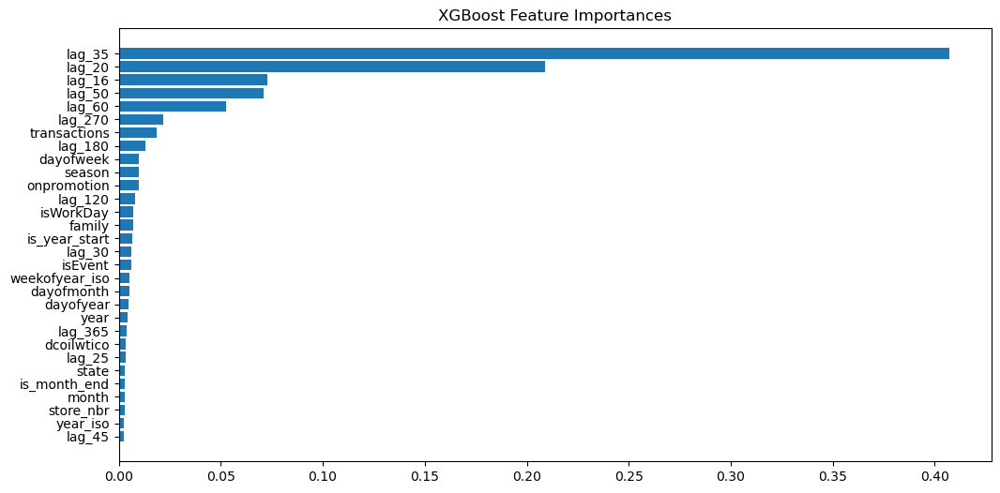

In [135]:
y_fit_xgb, y_pred_xgb, y_pred_test_real = xgb_predictor(X_all, X_all.iloc[:1,:], y_all, y_all.iloc[:1,:], X_test_real)

In [136]:
# (r2_train,rmse_train,mae_train),(r2_test,rmse_test,mae_test) = performance_both(y_train, y_fit_xgb, y_test, y_pred_xgb)

# submit

In [137]:
y_pred_test_real.columns=['sales']

In [138]:
# add zeros
y_pred_all = pd.concat([y_pred_test_real,test_pred_zeros[['sales']]], axis=0)
y_pred_all

,sales
id,
3000888,6.99
3000890,9.86
3000891,2348.52
3000892,5.56
3000893,393.29
...,...
3029173,0.00
3029239,0.00
3029254,0.00


In [139]:
# y_pred_all.to_csv("xgboost_ordinal_morelags.csv")
# !kaggle competitions submit -c store-sales-time-series-forecasting -f xgboost_ordinal_morelags.csv -m "xgboost \
# in  ordinal encoding more lags"

# END